# Aleksandra Miesiąc 
## Raport z działania algorytmów:

 * genieclust

 * MeanShift
 
 * KMeans
 
 * AgglomerativeClustering
 
 * Moj <- spectral_clustering
 
 * hierarchicznych:
     * single
     * average
     * ward
     * weighted
     * centroid
     * complete
     * median

In [1]:
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np
from porownanie import wczytaj_dane


In [5]:
danebench = pd.read_csv("danebench")
danebench.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
danebench1 = pd.read_csv("danebench1")
danebench1.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
NapisanyAlgorytm = pd.read_csv("NapisanyAlgorytm")
NapisanyAlgorytm.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
NapisanyAlgorytmMoje = pd.read_csv("NapisanyAlgorytmMoje")
NapisanyAlgorytmMoje.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
danebench = danebench.append(danebench1).append(NapisanyAlgorytm).append(NapisanyAlgorytmMoje)
AMstat = danebench.groupby("Dane")["AM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"AMmin", "mean":"AMmean","max":"AMmax"})
FMstat = danebench.groupby("Dane")["FM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"FMmin", "mean":"FMmean","max":"FMmax"})
ARstat = danebench.groupby("Dane")["AR"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"ARmin", "mean":"ARmean","max":"ARmax"})
AMalg = danebench.groupby("nazwa algorytmu")["AM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"AMmin", "mean":"AMmean","max":"AMmax"})
FMalg = danebench.groupby("nazwa algorytmu")["FM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"FMmin", "mean":"FMmean","max":"FMmax"})
ARalg = danebench.groupby("nazwa algorytmu")["AR"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"ARmin", "mean":"ARmean","max":"ARmax"})
posrednie = pd.merge(AMalg, FMalg, on = "nazwa algorytmu")
alg = pd.merge(posrednie, ARalg, on = "nazwa algorytmu")
AMmax = pd.merge(AMstat, danebench, left_on = ["Dane","AMmax"], right_on = ["Dane","AM"])
ARmax = pd.merge(ARstat, danebench, left_on = ["Dane","ARmax"], right_on = ["Dane","AR"])
FMmax = pd.merge(FMstat, danebench, left_on = ["Dane","FMmax"], right_on = ["Dane","FM"])
najAM = AMmax.groupby("nazwa algorytmu").size().rename("CountmaxAM").reset_index()
najAR = ARmax.groupby("nazwa algorytmu").size().rename("CountmaxAR").reset_index()
najFM = FMmax.groupby("nazwa algorytmu").size().rename("CountmaxFM").reset_index()
naj = najAM.assign(CountmaxAR = najAR.CountmaxAR).assign(CountmaxFM = najFM.CountmaxFM)
#danebench
naj.sort_values("CountmaxAR", ascending = False)#.head(3)


,nazwa algorytmu,CountmaxAM,CountmaxAR,CountmaxFM
7,genieclust,29,26,26
9,single,15,16,15
2,MeanShift,15,15,16
4,average,8,8,7
1,KMeans,7,7,7
10,ward,7,7,7
11,weighted,6,6,6
5,centroid,6,5,6
6,complete,5,5,5
8,median,4,4,4


Powyżej została przedstawiona tabelka, w której mamy pokazane algorytmy, które działają najlepiej według metryk AM, AR i FM dla zwykłych danych.

* Kolumna 'CountmaxAM' przedstawia liczbę ile razy dany algorytm zadziałał najlepiej według miary AM.

* Kolumna 'CountmaxAR' przedstawia liczbę ile razy dany algorytm zadziałał najlepiej według miary Randa AR.

* Kolumna 'CountmaxFM' przedstawia liczbę ile razy dany algorytm zadziałał najlepiej według miary Fowlkesa–Mallowsa FM.

## Załadowanie danych

In [6]:
katalog = ["fcps","graves","other","sipu","wut"]
data, lista_baz, labels = wczytaj_dane(katalog)

In [31]:
y_pred =[]
for i in range(len(lista_baz)):
    y_pred.append(np.loadtxt(lista_baz[i]+"y_pred"))

# Porównanie trzech najlepszych algorytmów

In [7]:
nazwy = ["genieclust","MeanShift","single","Eksperts"]
%config InlineBackend.figure_format = 'svg'
plt.rcParams["figure.figsize"] = (12,9)
miara = ["AM","AR","FM"]

def Rysujs2catterplot(k,l,m, y_pred):
    fig = plt.figure(1)

    columns = 4
    rows = 3

    j=k
    licznik = 0
    #plt.title(["title","tit","jdj","ecjscn"], size = 10)
    for i in range(1, columns*rows+1):
        
        while len(data[j][0]) !=2:
            j+=1
        fig.add_subplot(rows, columns, i)
        if i%4==0:
            plt.scatter(data[j].transpose()[0], data[j].transpose()[1], c=labels[j])
            
            print("Rysuję dla j = ", j)
            if licznik==0:
                plt.title(nazwy[i-1], size=20)
                j=l
            else:
                j=m
            licznik+=1
        else:
            plt.scatter(data[j].transpose()[0], data[j].transpose()[1], c=y_pred[j][(i-1)%4])
        if licznik==0:
            plt.title(nazwy[i-1], size=20)
        if i%4==1:
            plt.ylabel(miara[licznik])# fontsize=?
    plt.tight_layout()
    plt.show()
        

# Przykłady najlepszych przypasowań algorytmu genieclust

#### W trzech pierwzych kolumnach  jest przedstawione działanie poszczególnych algorytmów, w kolumnie "Eksperts" przedstawiony jest wzorcowy podział.
#### Pierwszy wiersz oznacza najlepsze dopasowanie omawianego algorytmu  według miary AM, drugi według indeksu Randa (AR), trzeci według indeksu Fowlkesa–Mallowsa (FM)

Rysuję dla j =  11
Rysuję dla j =  38
Rysuję dla j =  9


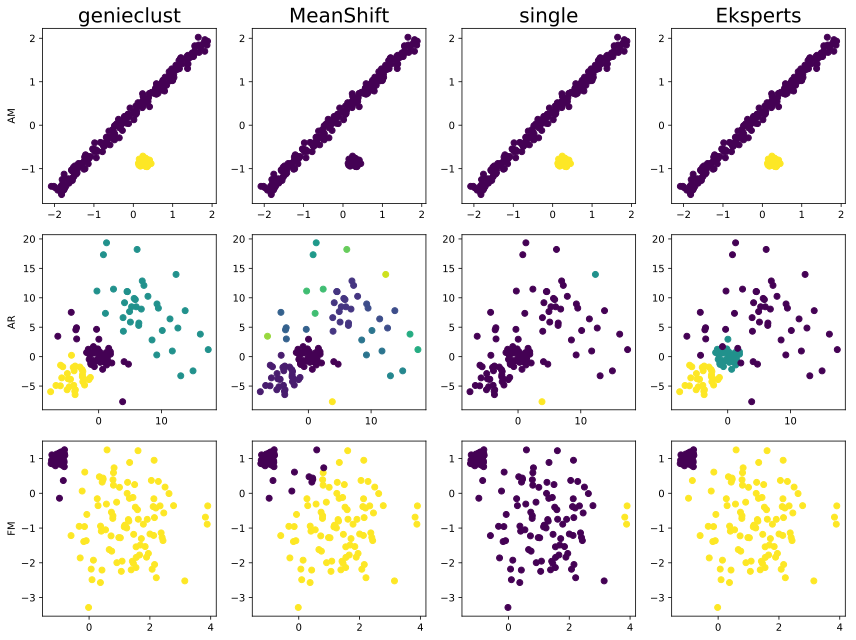

In [175]:
Rysujs2catterplot(11,38,9, y_pred)

# Zobaczmy jakie są parametry dla tych zbiorów i algorytmów

In [137]:
AMmax.iloc[4:5,[0,4,5,6,7]].append(danebench.query("Dane == 'fcps/engytime'").iloc[[0,10],[4,0,1,2,3]]).\
append(ARmax.iloc[79,[0,4,5,6,7]]).append(danebench.query("Dane == 'wut/x2'").iloc[[0,10],[4,0,1,2,3]]).\
append(FMmax.iloc[32,[0,4,5,6,7]]).append(danebench.query("Dane == 'graves/dense'").iloc[[0,10],[4,0,1,2,3]])

,Dane,nazwa algorytmu,FM,AM,AR
4,fcps/engytime,genieclust,0.906475,0.738793,8.124173e-01
22,fcps/engytime,single,0.706675,0.000244,4.769538e-07
32,fcps/engytime,MeanShift,0.907635,0.728836,8.150606e-01
79,wut/x2,genieclust,0.795186,0.744541,6.882872e-01
418,wut/x2,single,0.570898,-0.003125,-6.922578e-03
428,wut/x2,MeanShift,0.550659,0.340883,2.090548e-01
32,graves/dense,genieclust,0.980004,0.928732,9.602001e-01
99,graves/dense,single,0.694993,0.010542,6.031942e-04
109,graves/dense,MeanShift,0.904534,0.757395,8.090500e-01


Zauważmy, że zdecydowanie algorytm 'genieclust' przoduje, oraz zauważmy, że miara FM jest najbardziej tolerancyjna.

# Przykłady najlepszego dopasowania algorytmu hierarchicznego "single"

#### Kolumnowo jest przedstawione działanie poszczególnych algorytmów na zbiorach, w kolumnie "Eksperts" przedstawiony jest wzorcowy podział.
#### Pierwszy wiersz oznacza najlepsze dopasowanie omawianego algorytmu  według miary AM, drugi według indeksu Randa (AR), trzeci według indeksu Fowlkesa–Mallowsa (FM)

Rysuję dla j =  4
Rysuję dla j =  41
Rysuję dla j =  35


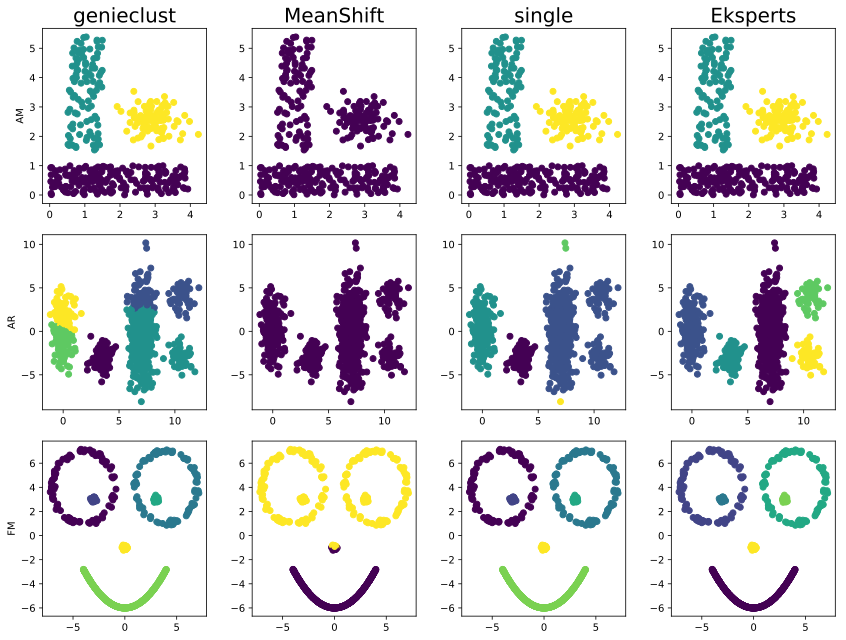

In [171]:
Rysujs2catterplot(3,41,35, y_pred)

## Zobaczmy jakie są parametry dla tych zbiorów i algorytmów

In [155]:
AMmax.iloc[5:6,[0,4,5,6,7]].append(danebench.query("Dane == 'fcps/hepta'").iloc[[7,10],[4,0,1,2,3]]).\
append(danebench.query("Dane == 'wut/z2'").iloc[[0,7,10],[4,0,1,2,3]]).\
append(danebench.query("Dane == 'wut/smile'").iloc[[0,7,10],[4,0,1,2,3]])

,Dane,nazwa algorytmu,FM,AM,AR
5,fcps/hepta,single,1.000000,1.000000,1.000000
40,fcps/hepta,genieclust,1.000000,1.000000,1.000000
43,fcps/hepta,MeanShift,1.000000,1.000000,1.000000
451,wut/z2,single,0.857472,0.690761,0.734711
458,wut/z2,genieclust,0.763693,0.705603,0.632896
461,wut/z2,MeanShift,0.640338,0.603393,0.471542
385,wut/smile,single,1.000000,1.000000,1.000000
392,wut/smile,genieclust,1.000000,1.000000,1.000000
395,wut/smile,MeanShift,0.585392,0.688449,0.441640


# Przykłady najlepszego dopasowania algorytmu "MeanShift"

#### Kolumnowo jest przedstawione działanie poszczególnych algorytmów na zbiorach, w kolumnie "Eksperts" przedstawiony jest wzorcowy podział.
#### Pierwszy wiersz oznacza najlepsze dopasowanie omawianego algorytmu  według miary AM, drugi według indeksu Randa (AR), trzeci według indeksu Fowlkesa–Mallowsa (FM)

In [179]:
Rysujs2catterplot(42,18,29, y_pred)

Rysuję dla j =  42
Rysuję dla j =  18
Rysuję dla j =  29


## Zobaczmy jakie są parametry dla tych zbiorów i algorytmów

In [177]:
danebench.query("Dane == 'wut/z3'").iloc[[10,7,0],[4,0,1,2,3]].\
append(danebench.query("Dane == 'sipu/a1'").iloc[[10,7,0],[4,0,1,2,3]]).\
append(danebench.query("Dane == 'sipu/s2'").iloc[[10,7,0],[4,0,1,2,3]])

,Dane,nazwa algorytmu,FM,AM,AR
472,wut/z3,MeanShift,1.000000,1.000000,1.000000
469,wut/z3,genieclust,0.772664,0.727031,0.664112
462,wut/z3,single,0.842077,0.726308,0.738692
208,sipu/a1,MeanShift,0.968017,0.973225,0.966345
205,sipu/a1,genieclust,0.904642,0.945322,0.898836
198,sipu/a1,single,0.563991,0.651533,0.443571
329,sipu/s2,MeanShift,0.941642,0.945852,0.937477
326,sipu/s2,genieclust,0.920887,0.933300,0.915229
319,sipu/s2,single,0.257040,0.000478,-0.000020


## Sprawdźmy jak na wyniki zadziała standaryzacja zmiennych

In [9]:
danebenchSTD = pd.read_csv("danebenchstd")
danebenchSTD.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
danebench1STD = pd.read_csv("danebench1std")
danebench1STD.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
NapisanyAlgorytmSTD = pd.read_csv("NapisanyAlgorytmSTD")
NapisanyAlgorytmSTD.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
NapisanyAlgorytmMojeSTD = pd.read_csv("NapisanyAlgorytmMojeSTD")
NapisanyAlgorytmMojeSTD.columns = ["nazwa algorytmu","FM","AM","AR","Dane"]
danebenchSTD = danebenchSTD.append(danebench1STD).append(NapisanyAlgorytmSTD).append(NapisanyAlgorytmMojeSTD)
AMstat = danebenchSTD.groupby("Dane")["AM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"AMmin", "mean":"AMmean","max":"AMmax"})
FMstat = danebenchSTD.groupby("Dane")["FM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"FMmin", "mean":"FMmean","max":"FMmax"})
ARstat = danebenchSTD.groupby("Dane")["AR"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"ARmin", "mean":"ARmean","max":"ARmax"})
AMalg = danebenchSTD.groupby("nazwa algorytmu")["AM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"AMmin", "mean":"AMmean","max":"AMmax"})
FMalg = danebenchSTD.groupby("nazwa algorytmu")["FM"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"FMmin", "mean":"FMmean","max":"FMmax"})
ARalg = danebenchSTD.groupby("nazwa algorytmu")["AR"].describe().loc[:,["min","mean","max"]].reset_index().rename(columns = {"min":"ARmin", "mean":"ARmean","max":"ARmax"})
posrednie = pd.merge(AMalg, FMalg, on = "nazwa algorytmu")
alg = pd.merge(posrednie, ARalg, on = "nazwa algorytmu")
AMmax = pd.merge(AMstat, danebenchSTD, left_on = ["Dane","AMmax"], right_on = ["Dane","AM"])
ARmax = pd.merge(ARstat, danebenchSTD, left_on = ["Dane","ARmax"], right_on = ["Dane","AR"])
FMmax = pd.merge(FMstat, danebenchSTD, left_on = ["Dane","FMmax"], right_on = ["Dane","FM"])
najAM = AMmax.groupby("nazwa algorytmu").size().rename("CountmaxAM").reset_index()
najAR = ARmax.groupby("nazwa algorytmu").size().rename("CountmaxAR").reset_index()
najFM = FMmax.groupby("nazwa algorytmu").size().rename("CountmaxFM").reset_index()
naj = najAM.assign(CountmaxAR = najAR.CountmaxAR).assign(CountmaxFM = najFM.CountmaxFM)
#danebenchSTD
naj.sort_values("CountmaxAR", ascending = False)

,nazwa algorytmu,CountmaxAM,CountmaxAR,CountmaxFM
6,genieclust,29,25,25
8,single,15,17,16
1,MeanShift,15,15,16
3,average,8,8,7
0,KMeans,7,7,7
9,ward,7,7,7
4,centroid,7,6,7
5,complete,5,5,5
10,weighted,5,5,5
2,Moj,2,4,4


Powyżej została przedstawiona tabelka, w której mamy pokazane algorytmy, które działają najlepiej według metryk AM, AR i FM dla danych standaryzowanych.

* Kolumna 'CountmaxAM' przedstawia liczbę ile razy dany algorytm zadziałał najlepiej według miary AM.

* Kolumna 'CountmaxAR' przedstawia liczbę ile razy dany algorytm zadziałał najlepiej według miary Randa AR.

* Kolumna 'CountmaxFM' przedstawia liczbę ile razy dany algorytm zadziałał najlepiej według miary Fowlkesa–Mallowsa FM.

#### Zauważmy, że algorytm genieclust dalej jest na wysokim prowadzeniu, jednak algorytm MeanShift działa już gorzej w porównaniu z algorytmem single(gorzej względem metryki AR). Przed standaryzacją oba algorytmy plasowały się na drugm miejscu.

#### Zobaczmy jak na wyniki omaiwanych wcześniej zbiorów zadziałała standaryzacja zmiennych

Załadowanie danych 

In [199]:
y_predstd =[]
for i in range(len(lista_baz)):
    y_predstd.append(np.loadtxt(lista_baz[i]+"y_predstd"))

# Przykłady najlepszych przypasowań algorytmu genieclust

Rysuję dla j =  11
Rysuję dla j =  38
Rysuję dla j =  9


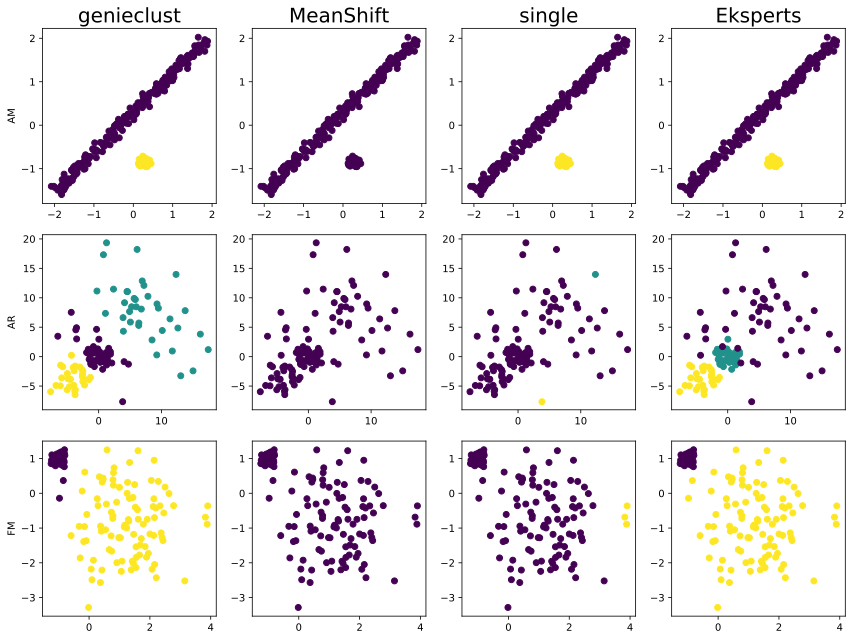

In [200]:
Rysujs2catterplot(11,38,9, y_predstd)

# Przykłady najlepszego dopasowania algorytmu hierarchicznego "single"

Rysuję dla j =  4
Rysuję dla j =  41
Rysuję dla j =  35


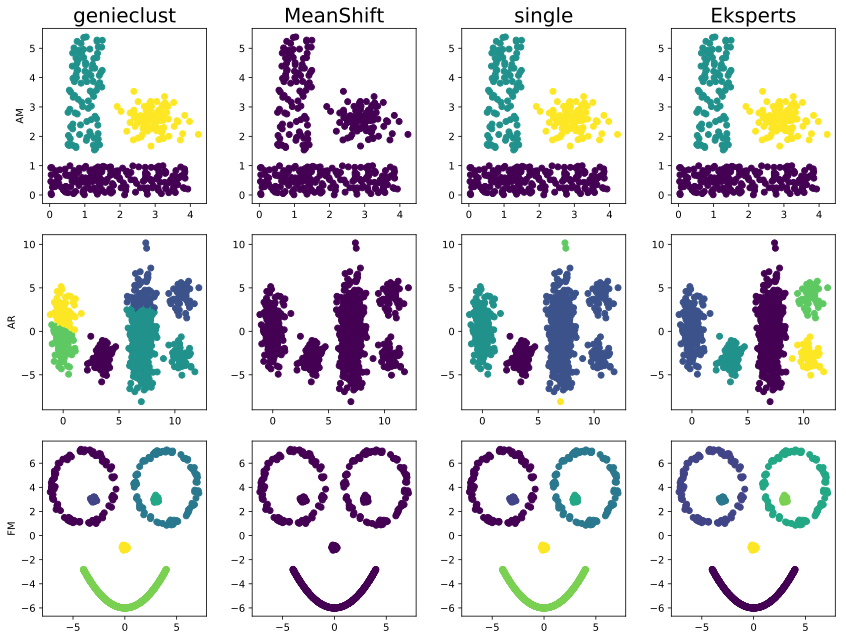

In [201]:
Rysujs2catterplot(3,41,35, y_predstd)

# Przykłady najlepszego dopasowania algorytmu "MeanShift"

In [202]:
Rysujs2catterplot(42,18,29, y_predstd)

Rysuję dla j =  42
Rysuję dla j =  18
Rysuję dla j =  29


Zauważmy, że standaryzacja zmiennych źle wpłynęła na algorytm "MeanShift" mimo, że srednio ma on lepsze wyniki niź algorytm hierarchiczny "single".
Algorytm 'genieclust' poprawił swoją dokładność, jednakże jeżeli chcemy używać algorytmu "MeanShift" powiniśmy używać danych niestandaryzowanych.
Dla algorytmu hierarchicznego 'single' nie wniosło to jakiejś zauważalnej zmiany, więc było ono niepotrzebne.